# ДЗ №1 СУНЦ МГУ - Numpy practice

_Задачи позаимствованы из курса ML ФКН ПМИ где они были позаимствованы из курса практикума кафедры ММП факультета ВМК МГУ_ 

### Туториальные задачи
__(9 баллов)__

Ниже приведены задачи на работу с numpy-массивами. Для каждой из задач нужно привести 2 реализации: одна без использования numpy (cчитайте, что там, где на входе или выходе должны быть numpy array, будут просто списки), а вторая полностью векторизованная (без использования питоновских циклов/map/list comprehension). Невекторизованная реализация каждой из задач оценивается в __0.5 балла__, векторизованная – в __1 балл__.

Реализации без использования векторизации нужно записать в файл functions.py, а векторизованные &mdash; в файл functions_vectorized.py

Для каждой задачи, приведённой ниже сравните скорость работы невекторизованной и векторизованной реализации. С помощью пакета matplotlib постройте графики времени работы в зависимости от размера данных. __Графики должны выглядеть опрятно!__ То есть должны быть подписаны оси, названия графиков, и т.д. Например, ниже представлены хороший и плохой графики:

C:\Users\Oleg\AppData\Local\Temp\ipykernel_6900\1153710140.py:30: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  f.show()


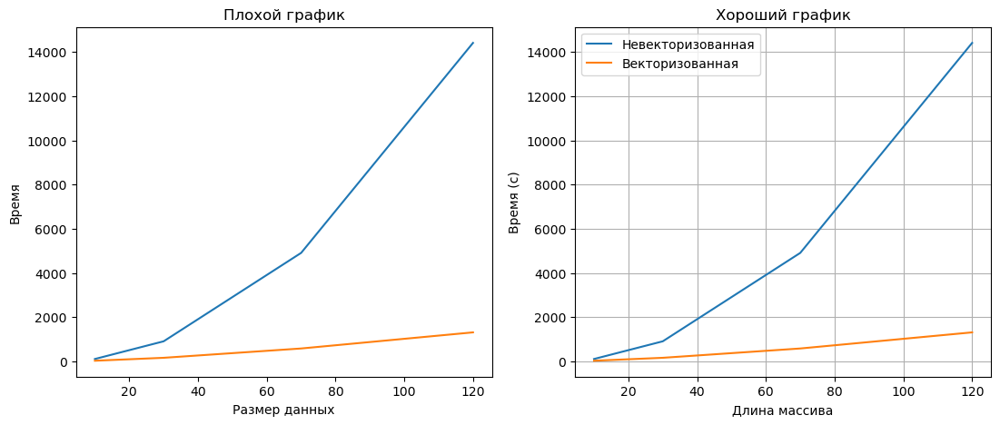

In [25]:
import matplotlib.pyplot as plt
import numpy as np
from time import time
import random
import functions_vectorized as fv
import functions as fn

%matplotlib inline

data_size = np.array([10, 30, 70, 120])
time_non_vectorized = data_size ** 2 + 10
time_vectorized = data_size ** 1.5

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5))

ax1.plot(data_size, time_non_vectorized)
ax1.plot(data_size, time_vectorized)
ax1.set_title(u"Плохой график")
ax1.set_xlabel(u"Размер данных")
ax1.set_ylabel(u"Время")

ax2.plot(data_size, time_non_vectorized, label=u"Невекторизованная")
ax2.plot(data_size, time_vectorized, label=u"Векторизованная")
ax2.set_title(u"Хороший график")
ax2.set_xlabel(u"Длина массива")
ax2.set_ylabel(u"Время (с)")
ax2.grid()
ax2.legend()

f.show()              

* __Задача 1__: Подсчитать произведение ненулевых элементов на диагонали прямоугольной матрицы.  
 Например, для X = np.array([[1, 0, 1], [2, 0, 2], [3, 0, 3], [4, 4, 4]]) ответ – 3.

In [26]:
import numpy as np
from time import time
import random
import functions_vectorized as fv
import functions as fn
import importlib
importlib.reload(fn)
importlib.reload(fv)

CNT_ITER = 150
MAX_LEN = 200
MAX_SIZE = 200
MAX_MUL = 10
time_vectorized = []
time_non_vectorized = []
for LEN in range(1, MAX_LEN+1):
    if (LEN % 100 == 0):
        print(LEN)
    summary_vect = 0
    summary_nvec = 0
    
    for it in range(CNT_ITER):
        x = np.random.rand(LEN, random.randint(LEN, MAX_SIZE)) * MAX_MUL
        
        s1 = time()
        fv.prod_non_zero_diag(x)
        summary_vect += time() - s1
        
        x.tolist()
        s2 = time()
        fn.prod_non_zero_diag(x)
        summary_nvec += time() - s2
        
    for it in range(CNT_ITER):
        x = np.random.rand(random.randint(LEN, MAX_SIZE), LEN) * MAX_MUL
        
        s1 = time()
        fv.prod_non_zero_diag(x)
        summary_vect += time() - s1
        
        x.tolist()
        s2 = time()
        fn.prod_non_zero_diag(x)
        summary_nvec += time() - s2
        
    time_vectorized.append(summary_vect / (2*CNT_ITER))
    time_non_vectorized.append(summary_nvec / (2*CNT_ITER))

100
200


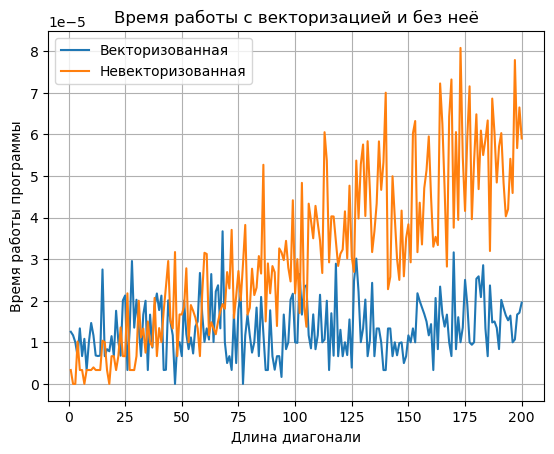

In [27]:
import matplotlib.pyplot as plt

plt.plot([i for i in range(1, MAX_LEN+1)], time_vectorized, label='Векторизованная')
plt.plot([i for i in range(1, MAX_LEN+1)], time_non_vectorized, label='Невекторизованная')

plt.title('Время работы с векторизацией и без неё')
plt.xlabel('Длина диагонали')
plt.ylabel('Время работы программы')

plt.grid()
plt.legend()

plt.show()

 
 
* __Задача 2__: Даны два вектора x и y. Проверить, задают ли они одно и то же мультимножество.  
  Например, для x = np.array([1, 2, 2, 4]), y = np.array([4, 2, 1, 2]) ответ – True.
  
  


In [28]:
import numpy as np
from time import time
import random
import functions_vectorized as fv
import functions as fn
import importlib
importlib.reload(fn)
importlib.reload(fv)

MAX_LEN = 500
CNT_ITER = 200

time_vectorized = []
time_non_vectorized = []

for LEN in range(1, MAX_LEN+1):
    if (LEN % 100 == 0):
        print(LEN)
    summary_vect = 0
    summary_nvec = 0
    
    for it in range(CNT_ITER):
        a = np.random.rand(LEN)
        b = np.random.rand(LEN)
        
        s1 = time()
        fv.are_multisets_equal(a, b)
        summary_vect += time() - s1
        
        s2 = time()
        fn.are_multisets_equal(a.tolist(), b.tolist())
        summary_nvec += time() - s2
    
    for it in range(CNT_ITER):
        a = np.random.rand(LEN)
        b = np.random.rand(random.randint(1, MAX_LEN))
        
        s1 = time()
        fv.are_multisets_equal(a, b)
        summary_vect += time() - s1
        
        s2 = time()
        fn.are_multisets_equal(a.tolist(), b.tolist())
        summary_nvec += time() - s2
    
    time_vectorized.append(summary_vect/(2*CNT_ITER))
    time_non_vectorized.append(summary_nvec/(2*CNT_ITER))

100
200
300
400
500


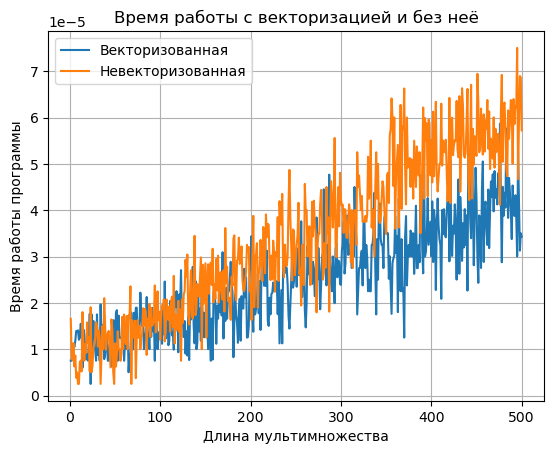

In [29]:
import matplotlib.pyplot as plt

plt.plot([i for i in range(1, MAX_LEN+1)], time_vectorized, label='Векторизованная')
plt.plot([i for i in range(1, MAX_LEN+1)], time_non_vectorized, label='Невекторизованная')

plt.title('Время работы с векторизацией и без неё')
plt.xlabel('Длина мультимножества')
plt.ylabel('Время работы программы')

plt.grid()
plt.legend()

plt.show()

* __Задача 3__: Найти максимальный элемент в векторе x среди элементов, перед которыми стоит нулевой.  
 Например, для x = np.array([6, 2, 0, 3, 0, 0, 5, 7, 0]) ответ – 5.

In [30]:
import numpy as np
from time import time
import random
import functions_vectorized as fv
import functions as fn
import importlib
importlib.reload(fn)
importlib.reload(fv)

MAX_LEN = 1000
CNT_ITER = 200
LEFT_BOUND = int(-1e9)
RIGHT_BOUND = int(1e9)

time_vectorized = []
time_non_vectorized = []

for LEN in range(2, MAX_LEN+1):
    if (LEN % 100 == 0):
        print(LEN)
    summary_vect = 0
    summary_nvec = 0
    
    for it in range(CNT_ITER):
        a = np.array([random.randint(LEFT_BOUND, RIGHT_BOUND) for _ in range(LEN)])
        
        s1 = time()
        fv.max_after_zero(a)
        summary_vect += time() - s1
        
        s2 = time()
        fn.max_after_zero(a.tolist())
        summary_nvec += time() - s2
    
    time_vectorized.append(summary_vect/(1*CNT_ITER))
    time_non_vectorized.append(summary_nvec/(1*CNT_ITER))

100
200
300
400
500
600
700
800
900
1000


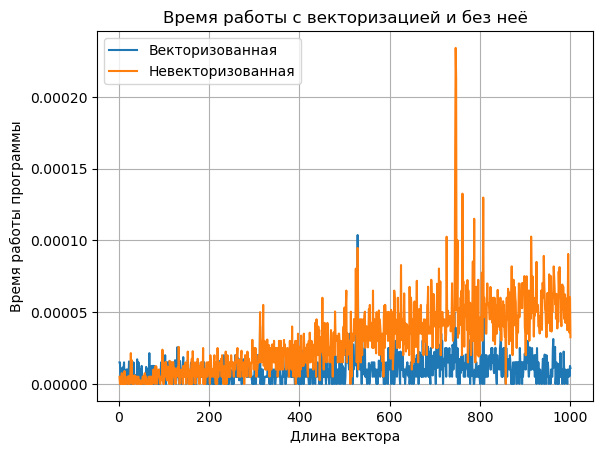

In [32]:
import matplotlib.pyplot as plt

plt.plot([i for i in range(2, MAX_LEN+1)], time_vectorized, label='Векторизованная')
plt.plot([i for i in range(2, MAX_LEN+1)], time_non_vectorized, label='Невекторизованная')

plt.title('Время работы с векторизацией и без неё')
plt.xlabel('Длина вектора')
plt.ylabel('Время работы программы')

plt.grid()
plt.legend()

plt.show()

 
 
* __Задача 4__: Дан трёхмерный массив, содержащий изображение, размера (height, width, numChannels), а также вектор длины numChannels. Сложить каналы изображения с указанными весами, и вернуть результат в виде матрицы размера (height, width). В ноутбуке приведите пример работы функции – преобразуйте цветное изображение в оттенки серого, использовав коэффициенты np.array([0.299, 0.587, 0.114]). Считать реальное изображение можно при помощи функции scipy.misc.imread (если изображение не в формате png, установите пакет pillow).


Время с векторизацией: 0.7150464057922363
Время без векторизцаии: 36.69969439506531


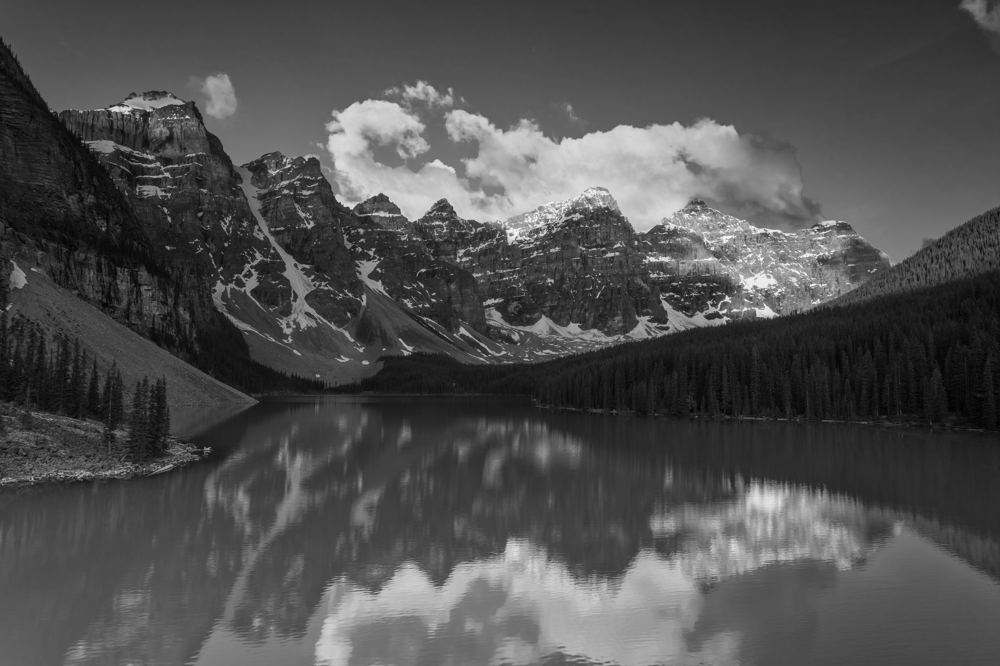

In [33]:
from PIL import Image
import numpy as np
from time import time
import functions_vectorized as fv
import functions as fn
import importlib
importlib.reload(fn)
importlib.reload(fv)

change = np.array([0.299, 0.587, 0.114])
img = Image.open('img/kuku.jpg')
#kuku.jpg - картинка 4k. если хотите поменьше, берите любую другую
data = np.asarray(img)

s1 = time()
gray_img = fv.convert_image(data, change)
ndata = Image.fromarray(gray_img)
print(f'Время с векторизацией: {time()-s1}')

s2 = time()
gray_img = fn.convert_image(data, change)
ndata = Image.fromarray(gray_img)
print(f'Время без векторизцаии: {time()-s1}')
display(ndata)

* __Задача 5__: Реализовать кодирование длин серий (Run-length encoding). Для некоторого вектора x необходимо вернуть кортеж из двух векторов одинаковой длины. Первый содержит числа, а второй - сколько раз их нужно повторить.  
 Например, для x = np.array([2, 2, 2, 3, 3, 3, 5]) ответ – (np.array([2, 3, 5]), np.array([3, 3, 1])).

In [1]:
import numpy as np
from time import time
import random
import functions_vectorized as fv
import functions as fn
import importlib
importlib.reload(fn)
importlib.reload(fv)

MAX_LEN = 700
CNT_ITER = 200

time_vectorized = []
time_non_vectorized = []

for LEN in range(1, MAX_LEN+1):
    if (LEN % 100 == 0):
        print(LEN)
    summary_vect = 0
    summary_nvec = 0
    
    for it in range(CNT_ITER):
        x = np.random.rand(LEN)
        
        s1 = time()
        i = fv.run_length_encoding(x)
        summary_vect += time()-s1
        
        s2 = time()
        i = fn.run_length_encoding(x)
        summary_nvec += time()-s2
    
    time_vectorized.append(summary_vect/CNT_ITER)
    time_non_vectorized.append(summary_nvec/CNT_ITER)

100
200
300
400
500
600
700


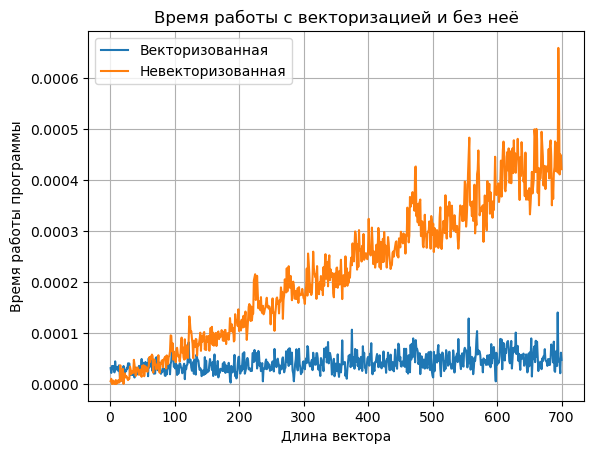

In [2]:
import matplotlib.pyplot as plt

plt.plot([i for i in range(1, MAX_LEN+1)], time_vectorized, label='Векторизованная')
plt.plot([i for i in range(1, MAX_LEN+1)], time_non_vectorized, label='Невекторизованная')

plt.title('Время работы с векторизацией и без неё')
plt.xlabel('Длина вектора')
plt.ylabel('Время работы программы')

plt.grid()
plt.legend()

plt.show()

 
 
* __Задача 6__: Даны две выборки объектов - X и Y. Вычислить матрицу евклидовых расстояний между объектами. Дополнительно сравните с функцией scipy.spatial.distance.cdist по скорости работы (сравнения приведите ниже в ноутбуке).

In [36]:
import scipy
import numpy as np
from time import time
import random
import functions_vectorized as fv
import functions as fn
import importlib
importlib.reload(fn)
importlib.reload(fv)

MAX_LEN = 100
CNT_ITER = 100

time_vectorized = []
time_non_vectorized = []
time_scipy = []

for LEN in range(1, MAX_LEN+1):
    if (LEN % 10 == 0):
        print(LEN)
    time_vect = 0
    time_nvec = 0
    time_cdist = 0
    for it in range(CNT_ITER):
        x = np.random.rand(LEN, LEN)
        y = np.random.rand(LEN, LEN)

        s1 = time()
        res = fv.pairwise_distance(x, y)
        time_vect += time() - s1

        s2 = time()
        res = fv.pairwise_distance(x, y)
        time_nvec += time() - s2

        s3 = time()
        res = scipy.spatial.distance.cdist(x, y)
        time_cdist += time() - s3
    time_vectorized.append(time_vect / CNT_ITER)
    time_non_vectorized.append(time_nvec / CNT_ITER)
    time_scipy.append(time_cdist / CNT_ITER)

10
20
30
40
50
60
70
80
90
100


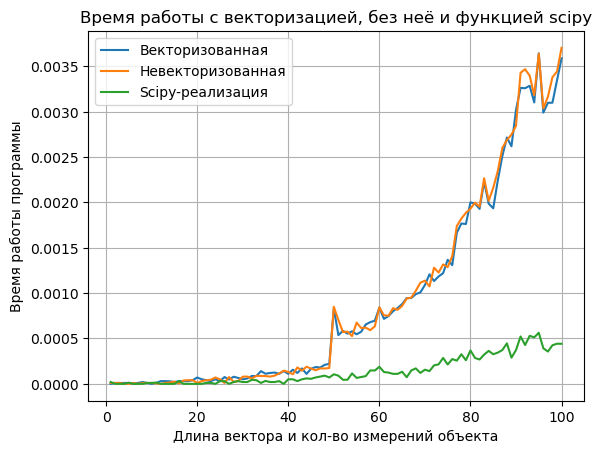

In [37]:
import matplotlib.pyplot as plt

plt.plot([i for i in range(1, MAX_LEN+1)], time_vectorized, label='Векторизованная')
plt.plot([i for i in range(1, MAX_LEN+1)], time_non_vectorized, label='Невекторизованная')
plt.plot([i for i in range(1, MAX_LEN+1)], time_scipy, label='Scipy-реализация')

plt.title('Время работы с векторизацией, без неё и функцией scipy')
plt.xlabel('Длина вектора и кол-во измерений объекта')
# 3D график очень муторно делается((
plt.ylabel('Время работы программы')

plt.grid()
plt.legend()

plt.show()

### Туториал по Markdown

__(1 балл)__

Напишите краткий (а в данной домашке ещё и почти бесмысленный) отчёт с использованием 4-5 различных вариантов разметки/выделения текста.

# Вариант 1
> *<u>Не украл, а адаптировал</u>*
>
>*©️ **Алексей Шевцов** aka **Олексiй Прядко** aka **itpedia** aka __Jolygolf__*

Круто __придумал__ функции ~~(взял со StackOverflow)~~\
Я хз, что ещё написать ну пусть

1. Задача 1
2. Задача 2
3. Задача бла-бла-бла...

- [x] сделал все задания

- [ ] не сделал график для пикчи(

Итого:

$x^2 = \frac{x * x}{1}$

P.S. я украл идею как делать тесты у Егора Кривова